In [1]:
# MODULES
from mne.io import read_raw_brainvision
from TFG_utils import (returnFolders, returnFiles, take_vmrk_files, take_vhdr_files, take_eeg_files, Get_Start_End, Get_spot_start_samples)
from mne.preprocessing import ICA
import mne
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
%matplotlib qt

In [2]:
# COLLECTING DATA
foldername = 'EEG_folders'

EEG_folders=returnFolders(foldername)
EEG_files=returnFiles(EEG_folders)

vmrk_files=take_vmrk_files(EEG_files)
vhdr_files=take_vhdr_files(EEG_files)
eeg_files=take_eeg_files(EEG_files)

In [3]:
i=5 # Carpeta EEG
print('Carpeta sujeto %s:'%(i),vhdr_files[i][40:44])
verbose=False
n_channels=31 # Number of channels to show in the plots

Carpeta sujeto 5: 2873


In [4]:
raw = read_raw_brainvision(vhdr_files[i],verbose=verbose).load_data(verbose=verbose)

data,times=raw[:]
info= raw.info
sampling_freq = int(info['sfreq'])

spots_times_sec = [0, 60, 120, 180, 226, 287, 347] # Time (sec) at which each spot begins
ini= int(60)*int(sampling_freq) #samples of 1st min of basal activity
start_end=Get_Start_End(vmrk_files[i]) # markers of the spots: start and end
spots_time=Get_spot_start_samples(start_end,sampling_freq, spots_times_sec)
spots_time # Time (samples) at which each spot begins

[36901, 66901, 96901, 126901, 149901, 180401, 210401]

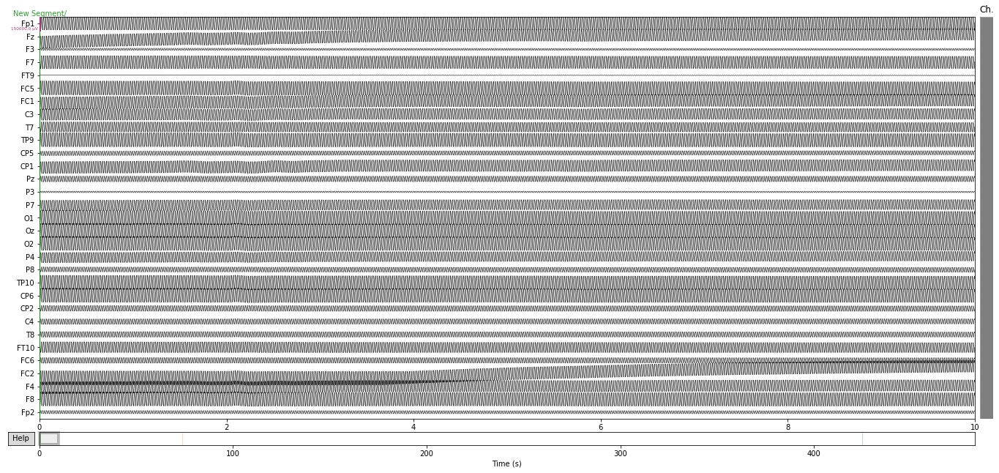

In [5]:
raw.plot(scalings={"eeg": 75e-3},title='Full EEG (not filtered)',verbose=verbose,n_channels=n_channels)
plt.show()

# DIVIDING EEG SIGNAL INTO SPOTS

In [6]:
ba=[]
sp1=[]
sp2=[]
sp3=[]
sp4=[]
sp5=[]
sp6=[]
sp7=[]

for ch in range(len(info['ch_names'])):
    ba.append(data[ch,:spots_time[0]]) # Basal activity
    sp1.append(data[ch,spots_time[0]:spots_time[1]]) #1st spot
    sp2.append(data[ch,spots_time[1]:spots_time[2]]) #2nd spot
    sp3.append(data[ch,spots_time[2]:spots_time[3]]) #3rd spot
    sp4.append(data[ch,spots_time[3]:spots_time[4]]) #4th spot
    sp5.append(data[ch,spots_time[4]:spots_time[5]]) #5th spot
    sp6.append(data[ch,spots_time[5]:spots_time[6]]) #6th spot
    sp7.append(data[ch,spots_time[6]:]) #7th spot

ba = mne.io.RawArray(ba, info,verbose=verbose)
sp1 = mne.io.RawArray(sp1, info,verbose=verbose)
sp2 = mne.io.RawArray(sp2, info,verbose=verbose)
sp3 = mne.io.RawArray(sp3, info,verbose=verbose)
sp4 = mne.io.RawArray(sp4, info,verbose=verbose)
sp5 = mne.io.RawArray(sp5, info,verbose=verbose)
sp6 = mne.io.RawArray(sp6, info,verbose=verbose)
sp7 = mne.io.RawArray(sp7, info,verbose=verbose)

In [7]:
epochs_titles=['ba','sp1','sp2','sp3','sp4','sp5','sp6','sp7']
epochs=[ba,sp1,sp2,sp3,sp4,sp5,sp6,sp7]

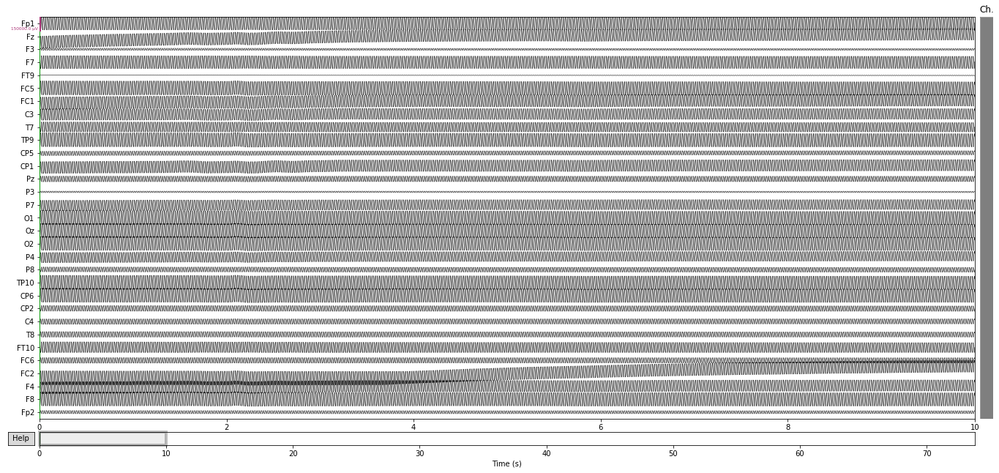

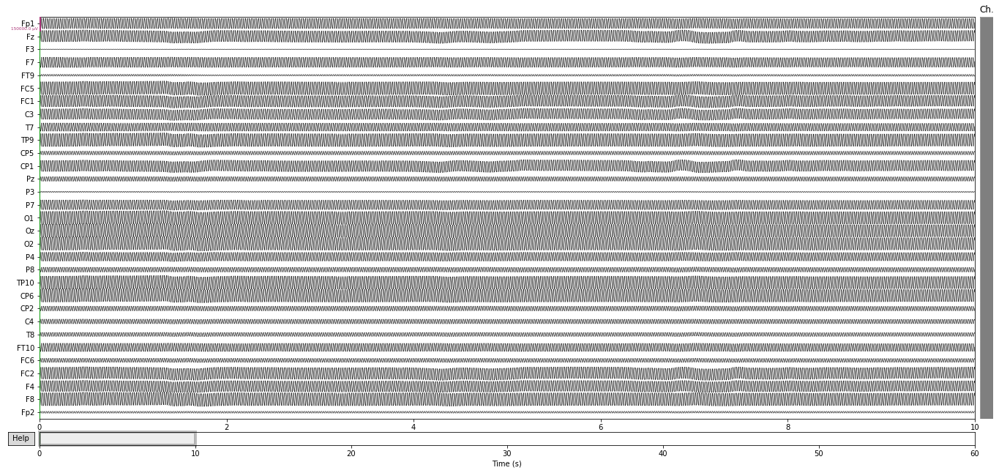

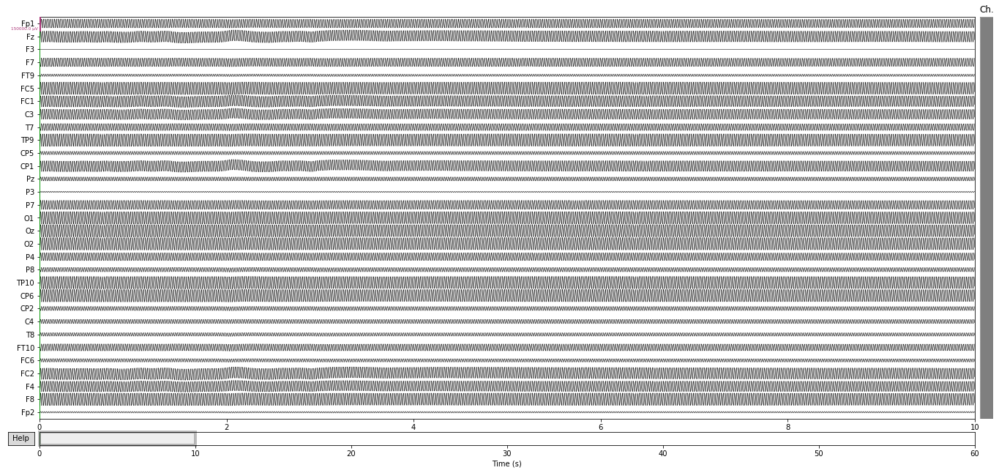

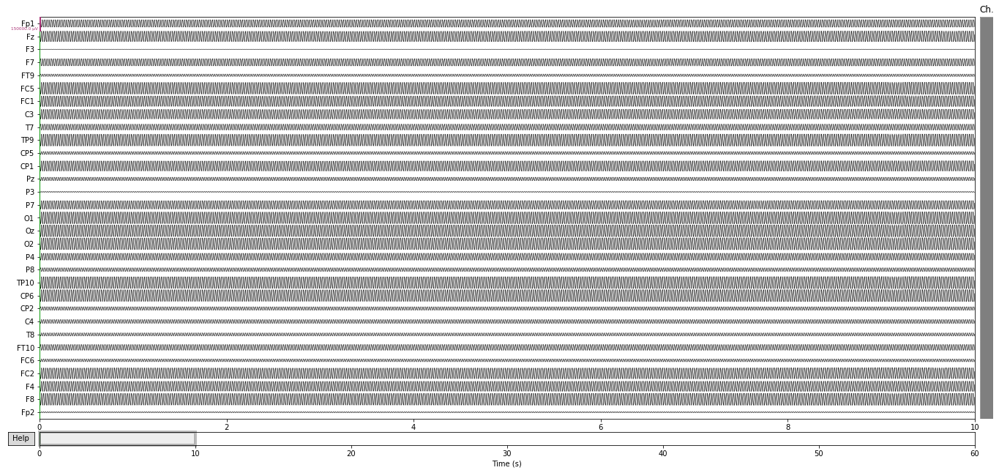

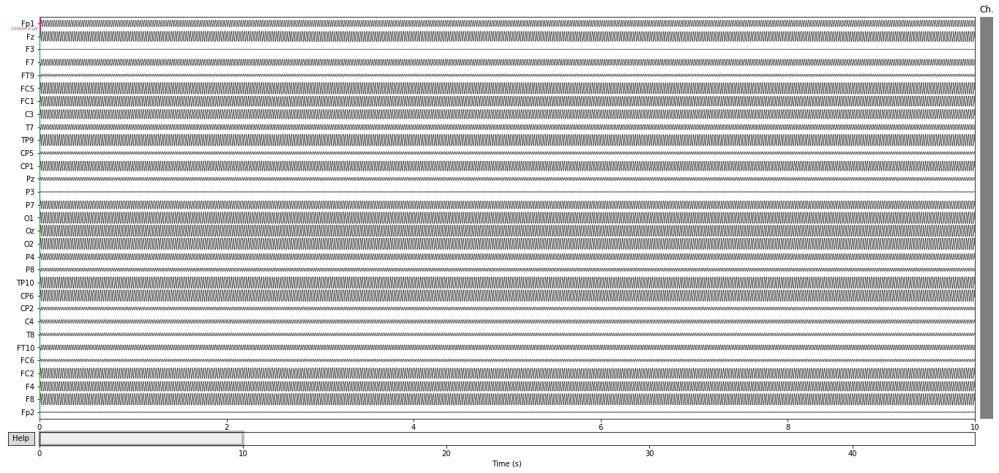

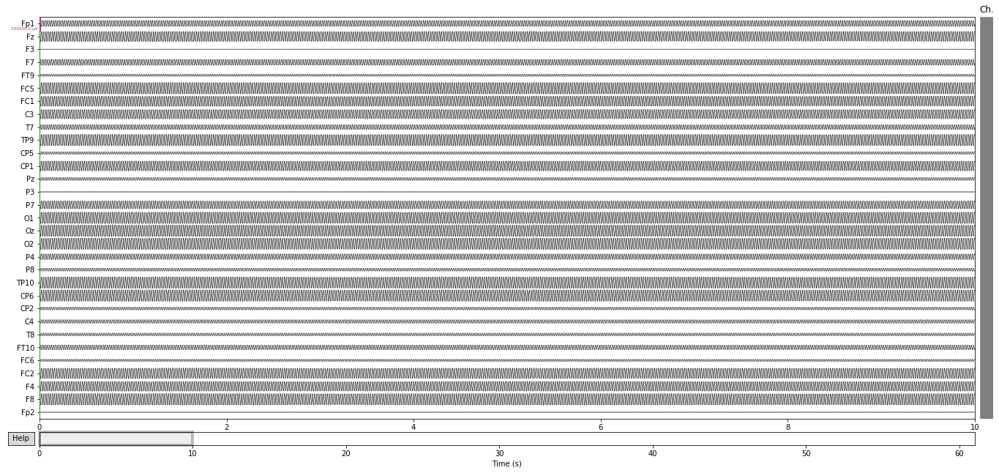

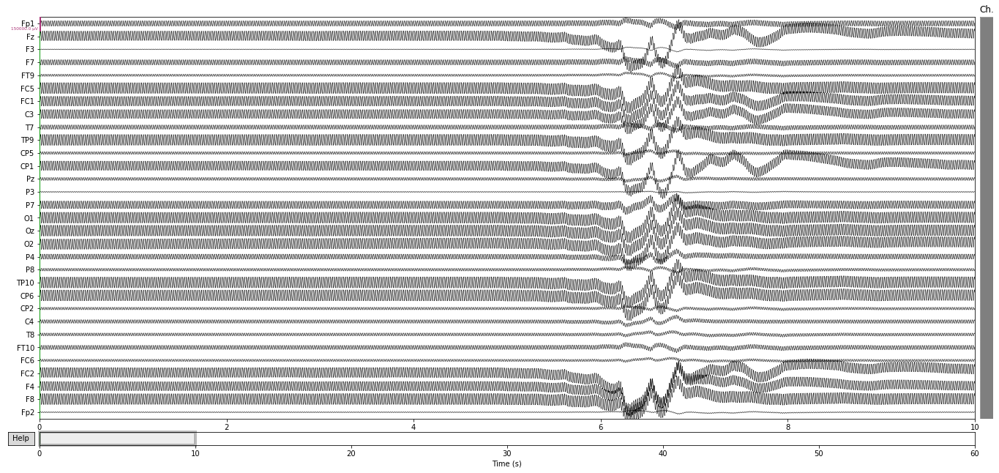

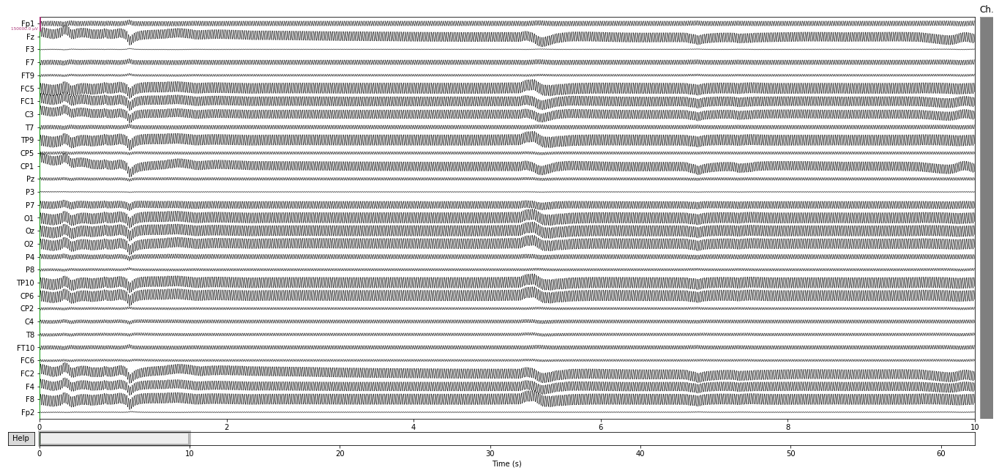

In [8]:
# EEG TIME PLOT ('all channels')
for e in range(len(epochs)):
    epochs[e].plot(scalings={"eeg": 75e-3},title='Not filtered %s EEG'%(epochs_titles[e]), verbose=verbose,n_channels=n_channels)
    plt.show()

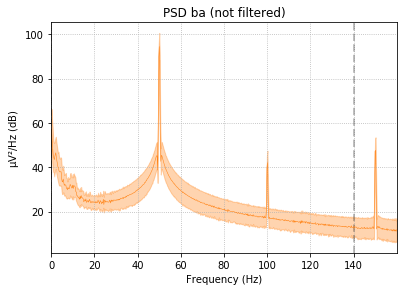

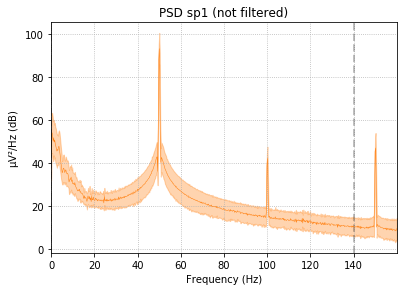

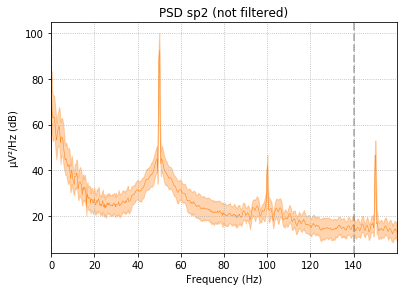

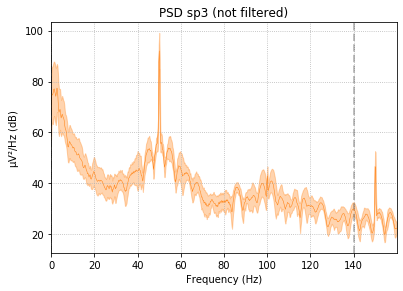

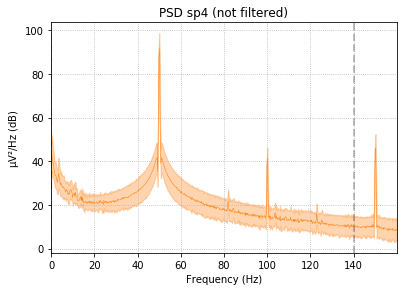

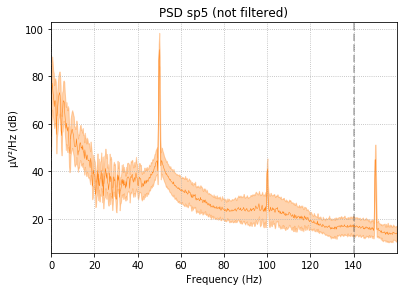

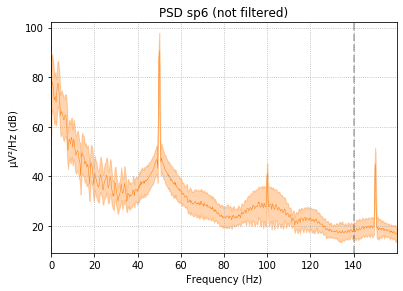

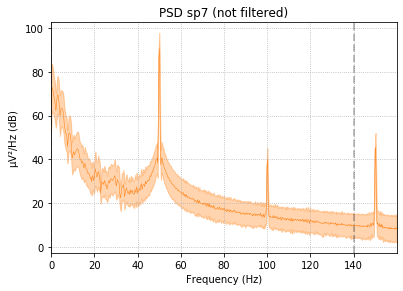

In [9]:
# PSD PLOT
for e in range(len(epochs)):
    epochs[e].plot_psd(fmax=160,proj=True, color='tab:orange', show=False, average=True,estimate='power')
    plt.title('PSD %s (not filtered)' %(epochs_titles[e]))
    plt.show()

In [10]:
plt.close('all')

# FILTERING

In [11]:
numtaps=20
order=2
epochs_filtered=['ba_filtered','sp1_filtered','sp2_filtered','sp3_filtered','sp4_filtered','sp5_filtered','sp6_filtered','sp7_filtered']

for e in range(len(epochs)):
    #Notch filter (IIR)
    epochs_filtered[e] = epochs[e].copy().set_montage("standard_1020",verbose=verbose)
    f0=50
    iir_params = dict(order=order, ftype='butter', output='ba')
    iir_params = mne.filter.construct_iir_filter(iir_params,sfreq=sampling_freq, f_pass= [49, 51],btype='bandstop',return_copy=False, verbose=verbose)
    b,a=(iir_params['b'],iir_params['a'])
    epochs_filtered[e].notch_filter(f0,method='iir',iir_params={'b':b,'a':a},verbose=verbose)

    #Band pass filter (FIR)
    f1,f2=(0.5,40)
    numtap=str(numtaps)+'s' #filter lenght in sec
    b = mne.filter.create_filter(epochs_filtered[e]['all'][1], filter_length=numtap,sfreq=sampling_freq, l_freq=f1, h_freq=f2,
                                 method='fir', fir_window='hann',fir_design='firwin', verbose=verbose)
    epochs_filtered[e].filter(l_freq=f1, h_freq=f2, filter_length=numtap, method='fir', fir_window='hann', fir_design='firwin',verbose=verbose)

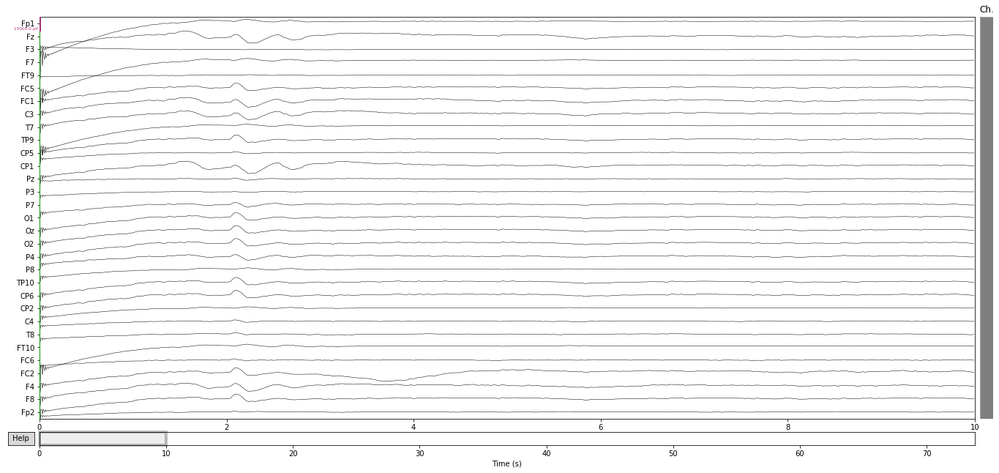

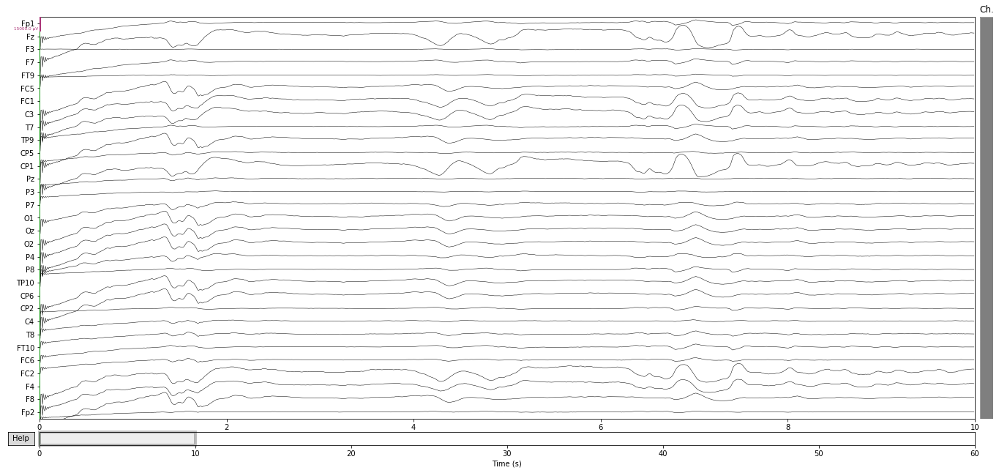

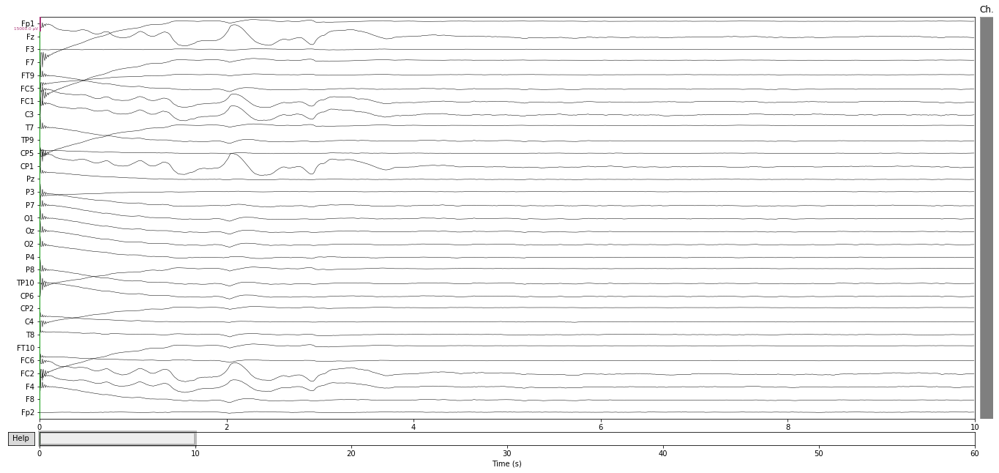

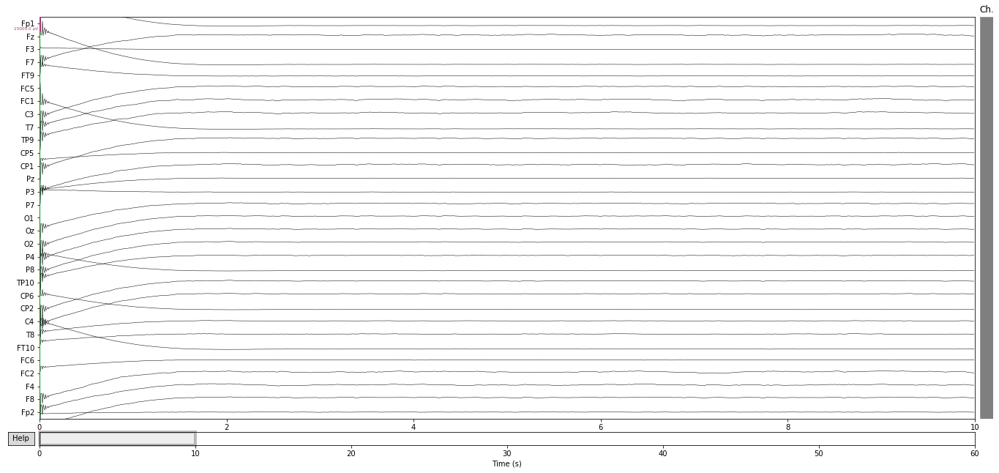

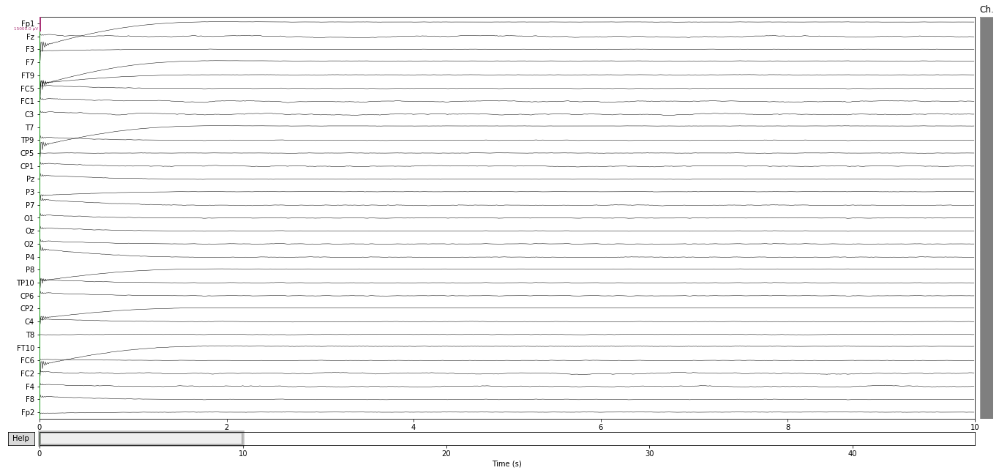

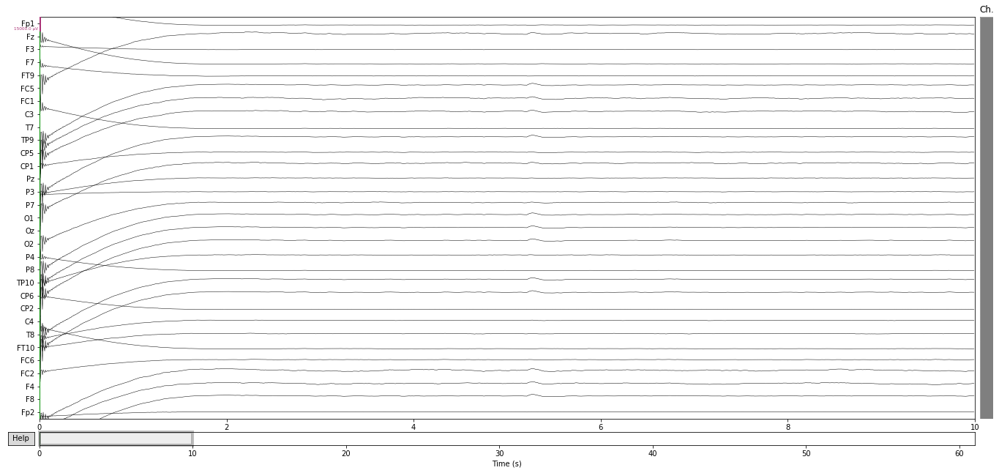

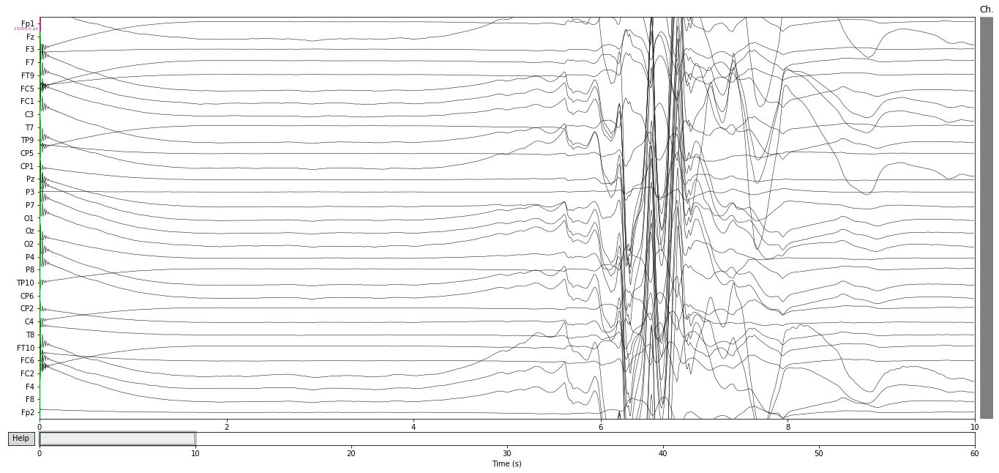

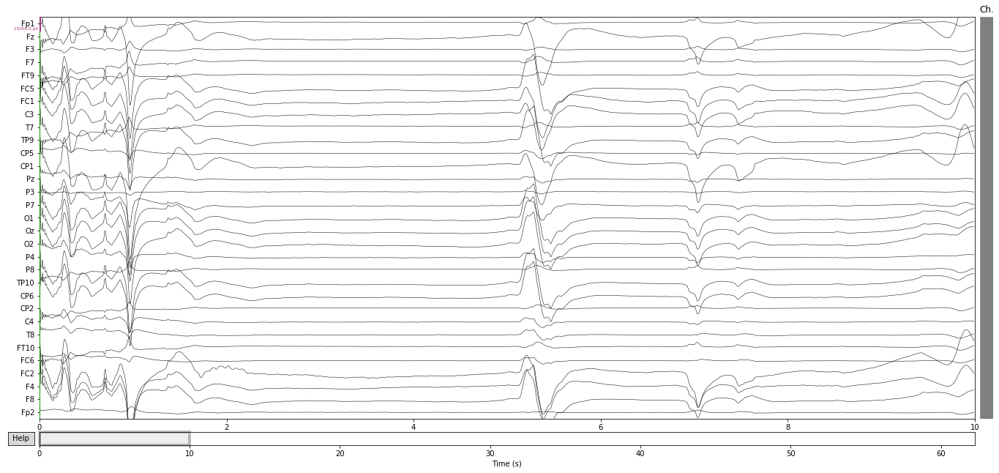

In [12]:
# EEG TIME PLOT ('all channels')
for e in range(len(epochs)):
    epochs_filtered[e].plot(scalings={"eeg": 75e-4},title='Filtered %s EEG'%(epochs_titles[e]), verbose=verbose,n_channels=n_channels)
    plt.show()

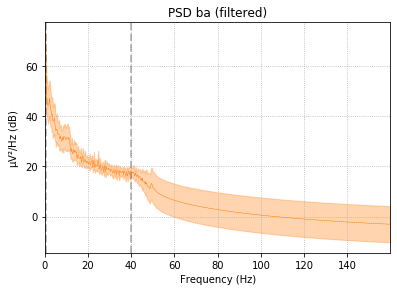

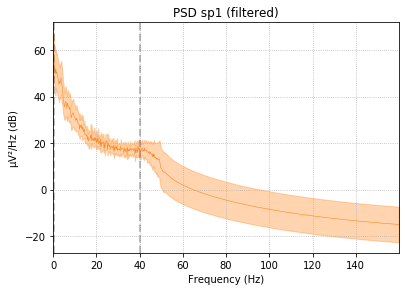

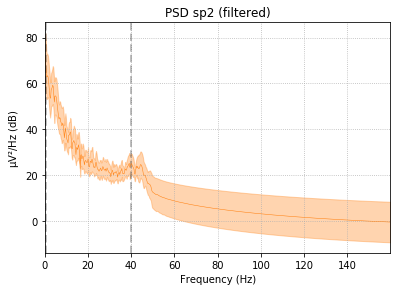

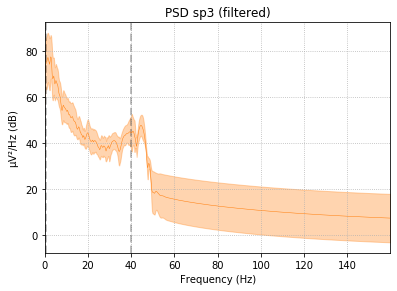

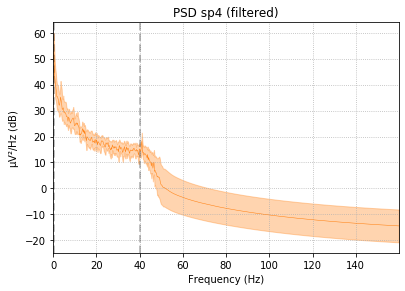

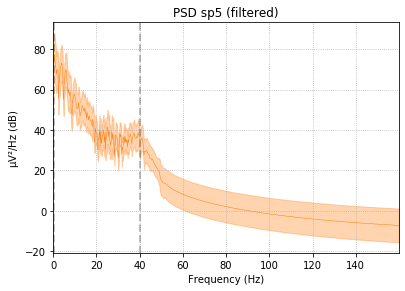

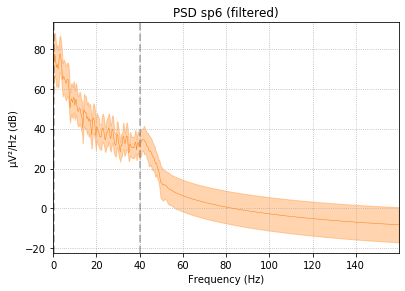

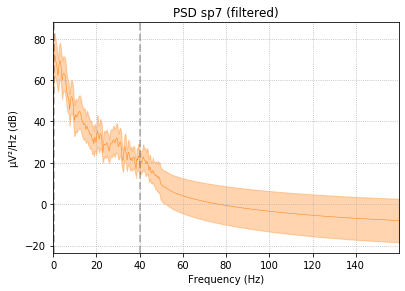

In [13]:
# PSD PLOT
for e in range(len(epochs)):
    epochs_filtered[e].plot_psd(fmax=160,proj=True, color='tab:orange', show=False, average=True,estimate='power')
    plt.title('PSD %s (filtered)'%(epochs_titles[e]))
    plt.show()

In [14]:
plt.close('all')

# ICA

#### PCA

Cumulative variance calculation to estimate how many components we need to perform the ICA algorithm (n_components).

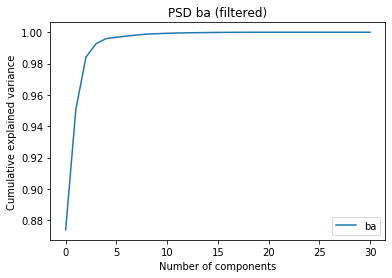

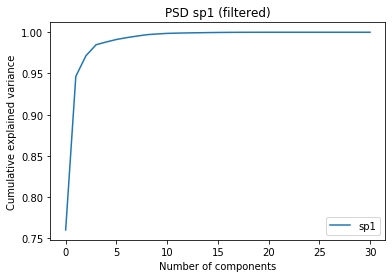

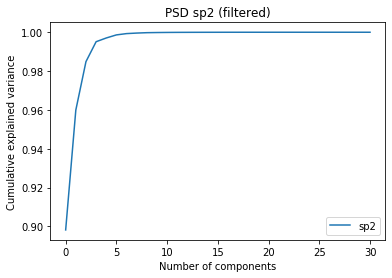

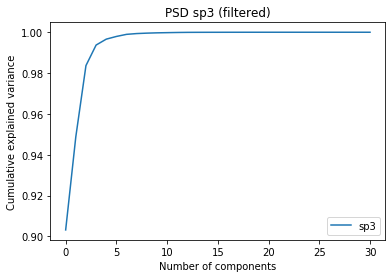

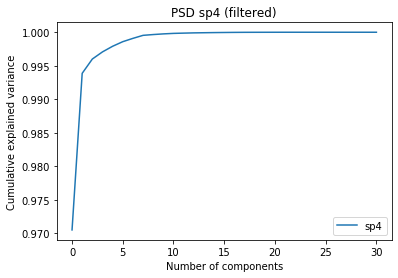

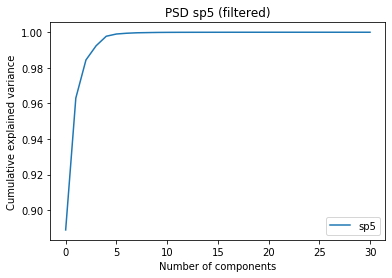

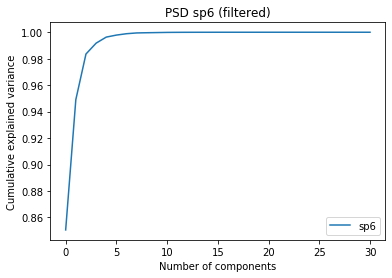

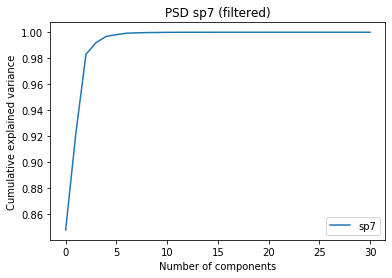

In [15]:
for e in range(len(epochs)):
    pca = PCA(n_components=None).fit(epochs_filtered[e]['all'][0])
    plt.plot(np.cumsum(pca.explained_variance_ratio_),label=epochs_titles[e])
    plt.xlabel('Number of components')
    plt.ylabel('Cumulative explained variance')
    plt.title('PSD %s (filtered)'%(epochs_titles[e]))
    plt.legend(loc='best')
    plt.show()

#### ICA

There are different methods for applying ICA algorithm: fastICA, infomax, picard (doesn't work).

In [16]:
epochs_ica=['ba_ica','sp1_ica','sp2_ica','sp3_ica','sp4_ica','sp5_ica','sp6_ica','sp7_ica']

for e in range(len(epochs)):
    epochs_ica[e] = mne.preprocessing.ICA(n_components=5,method="infomax", fit_params=dict(extended=True),random_state=1,max_iter=300, verbose=verbose)
    epochs_ica[e]=epochs_ica[e].fit(epochs_filtered[e])

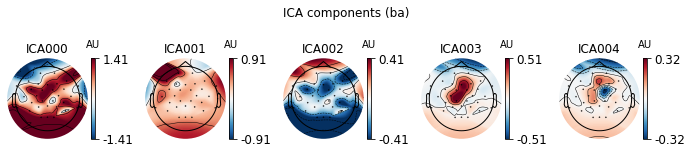

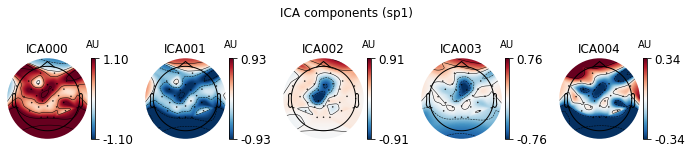

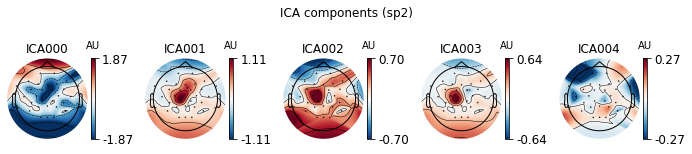

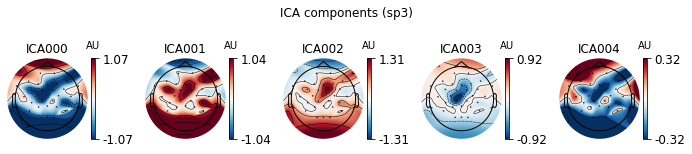

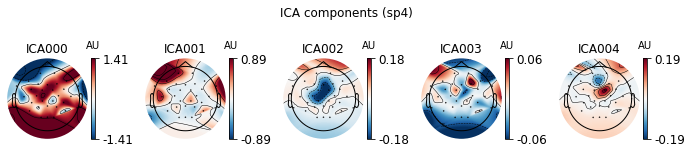

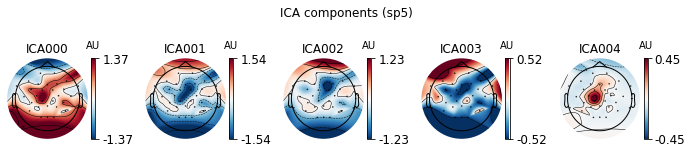

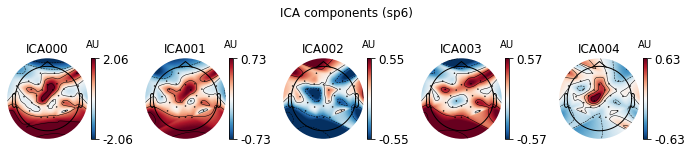

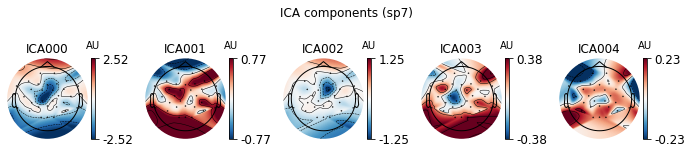

In [17]:
for e in range(len(epochs)):
    epochs_ica[e].plot_components(res=2**8, colorbar=True,outlines='skirt',title='ICA components (%s)'%(epochs_titles[e]),contours=5, inst=epochs_ica[e],plot_std=True,image_args={'vmin':None})
    plt.show()

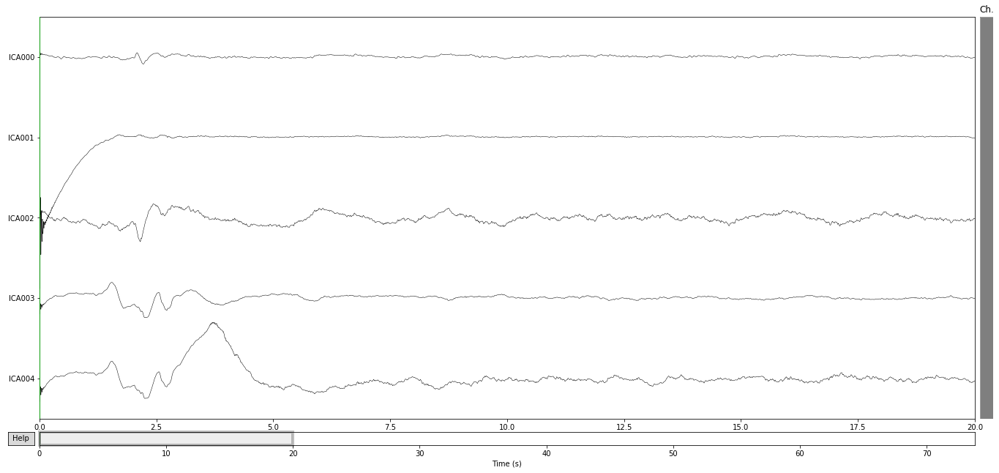

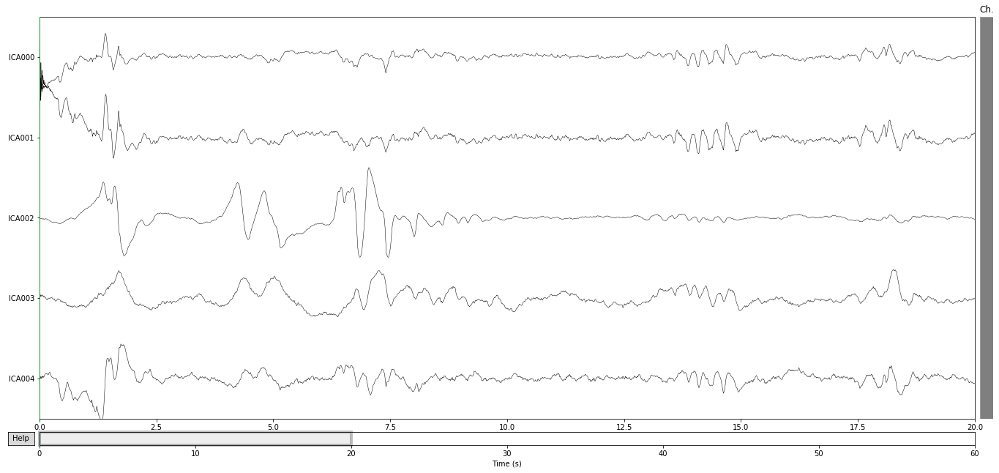

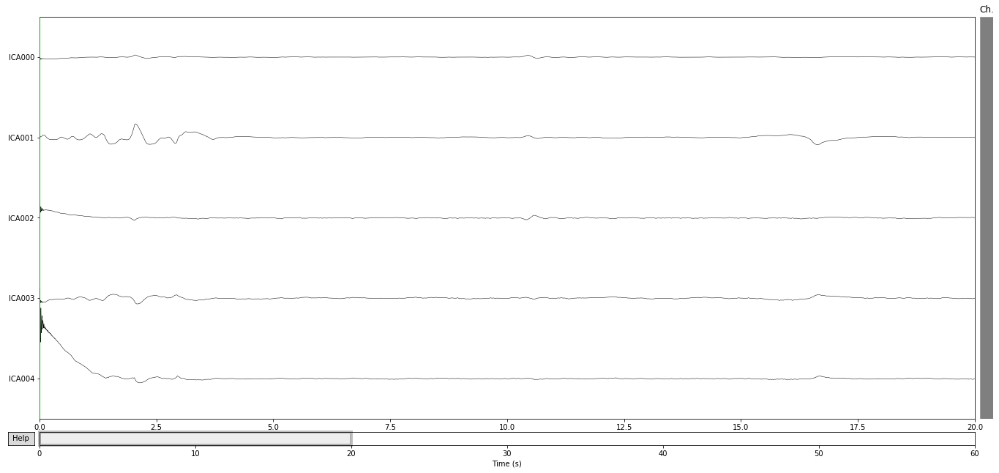

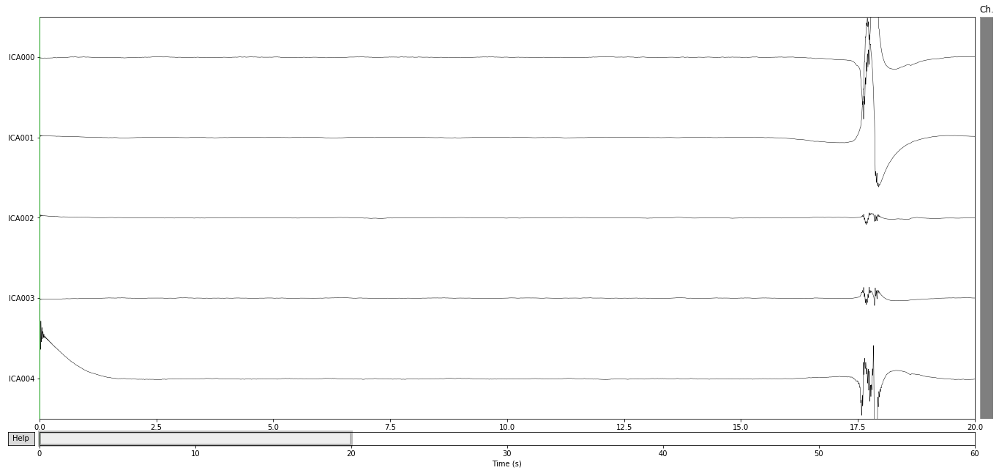

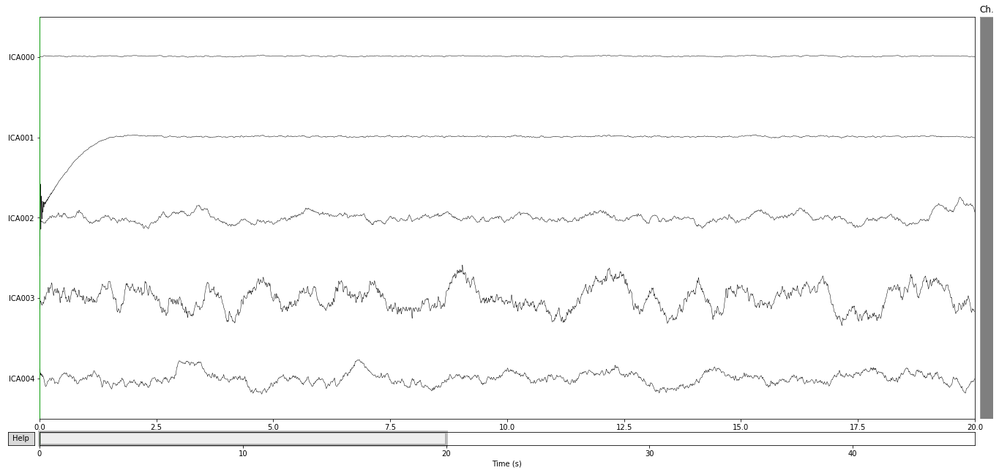

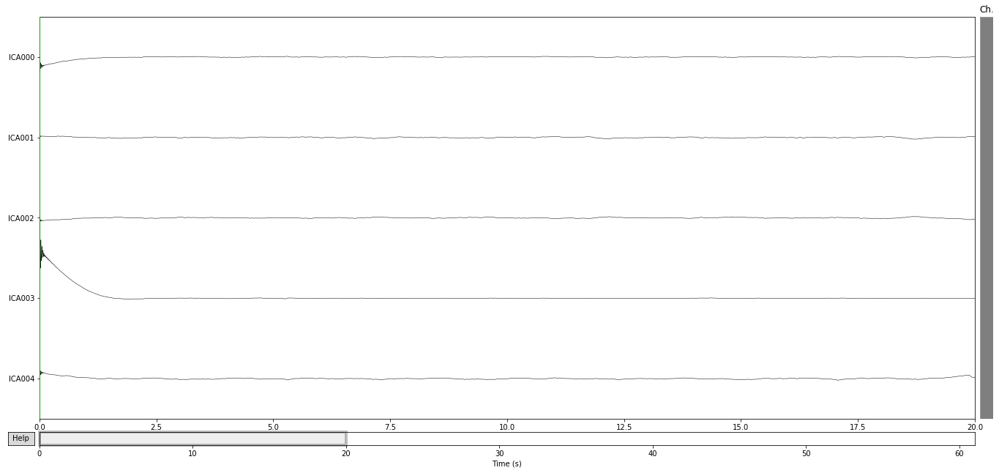

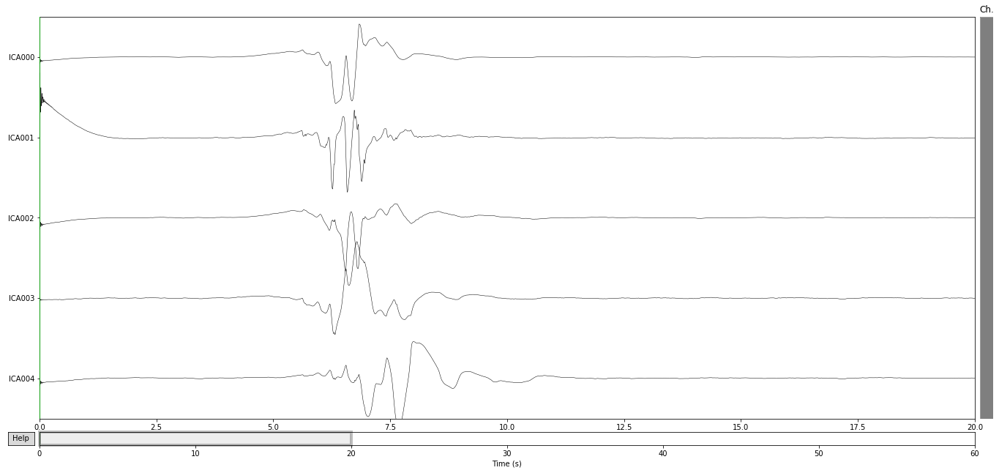

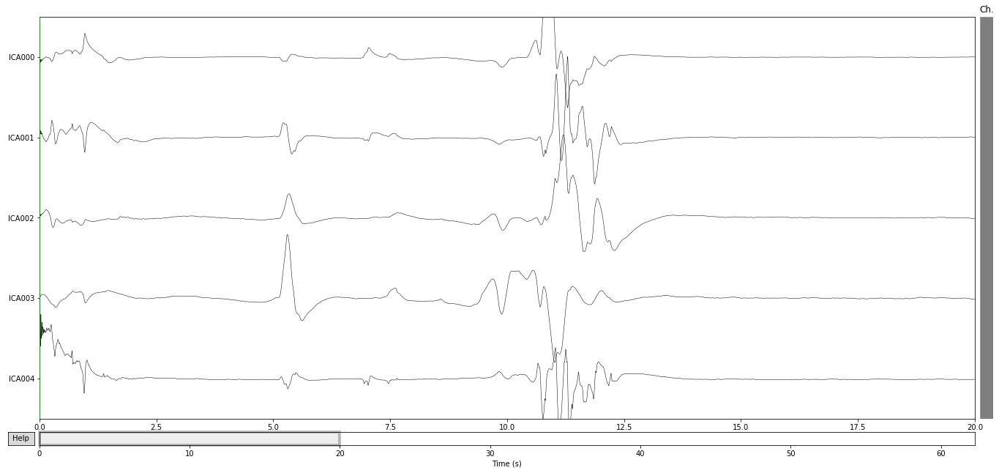

In [18]:
for e in range(len(epochs)):
    epochs_ica[e].plot_sources(epochs_filtered[e])
    plt.show()

In [19]:
plt.close('all')

#### EXCLUDE

In [20]:
#Components to exclude:
epochs_ica[0].exclude = [0]
epochs_ica[1].exclude = [2]
epochs_ica[2].exclude = [0]
epochs_ica[3].exclude = [3]
epochs_ica[4].exclude = [2]
epochs_ica[5].exclude = [4]
epochs_ica[6].exclude = [1]
epochs_ica[7].exclude = [0]

In [21]:
epochs_corrected=['ba_corrected','sp1_corrected','sp2_corrected','sp3_corrected','sp4_corrected','sp5_corrected','sp6_corrected','sp7_corrected']

In [22]:
for e in range(len(epochs)):
    epochs_corrected[e] = epochs_filtered[e].copy()
    epochs_ica[e].apply(epochs_corrected[e])

Transforming to ICA space (5 components)
Zeroing out 1 ICA component
Transforming to ICA space (5 components)
Zeroing out 1 ICA component
Transforming to ICA space (5 components)
Zeroing out 1 ICA component
Transforming to ICA space (5 components)
Zeroing out 1 ICA component
Transforming to ICA space (5 components)
Zeroing out 1 ICA component
Transforming to ICA space (5 components)
Zeroing out 1 ICA component
Transforming to ICA space (5 components)
Zeroing out 1 ICA component
Transforming to ICA space (5 components)
Zeroing out 1 ICA component


# RESULTS

#### EEG filtered (ICA not applied):

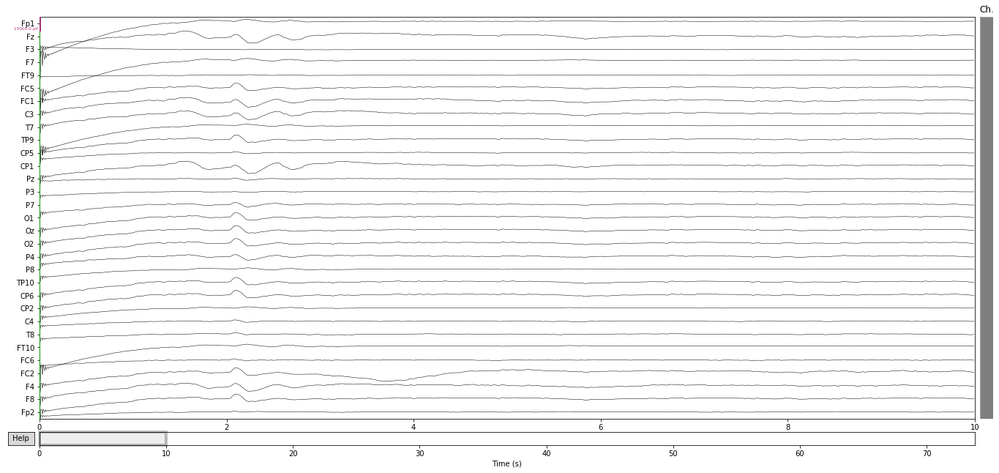

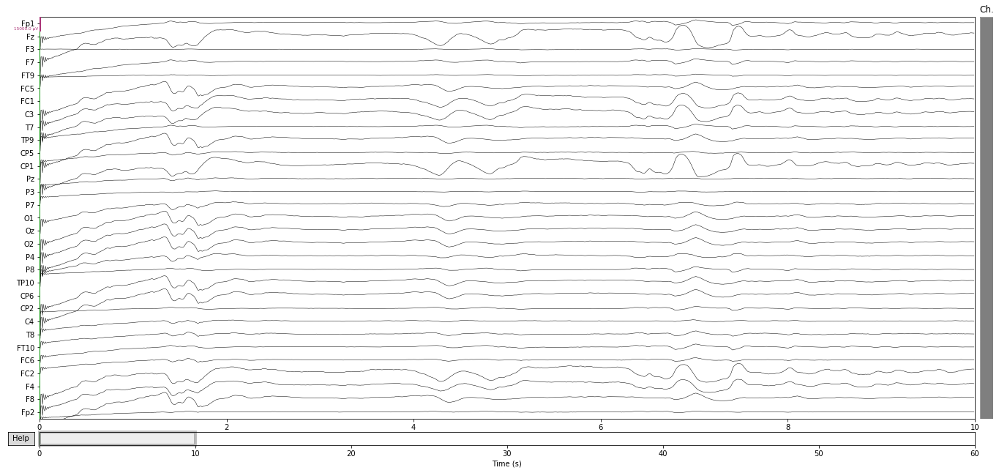

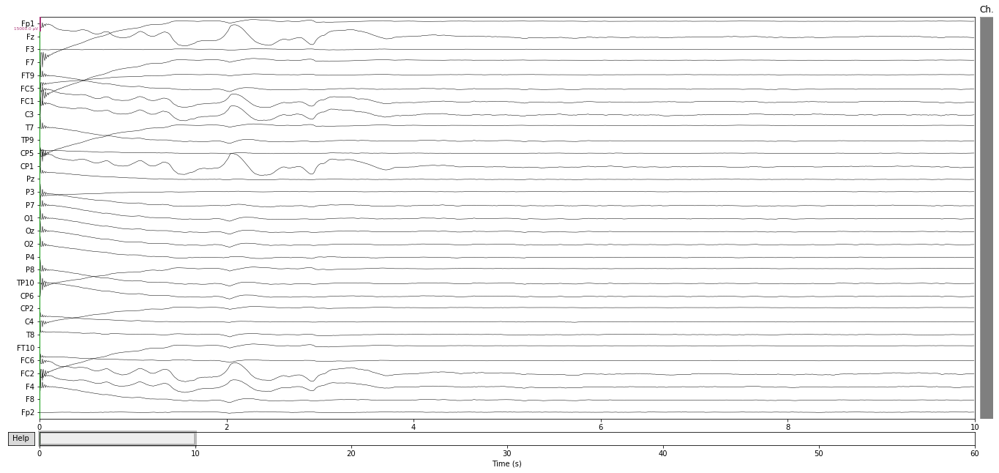

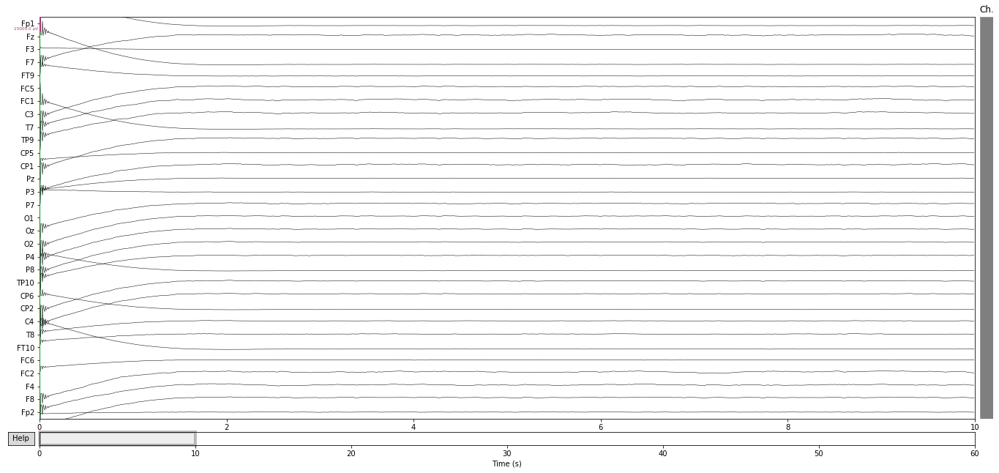

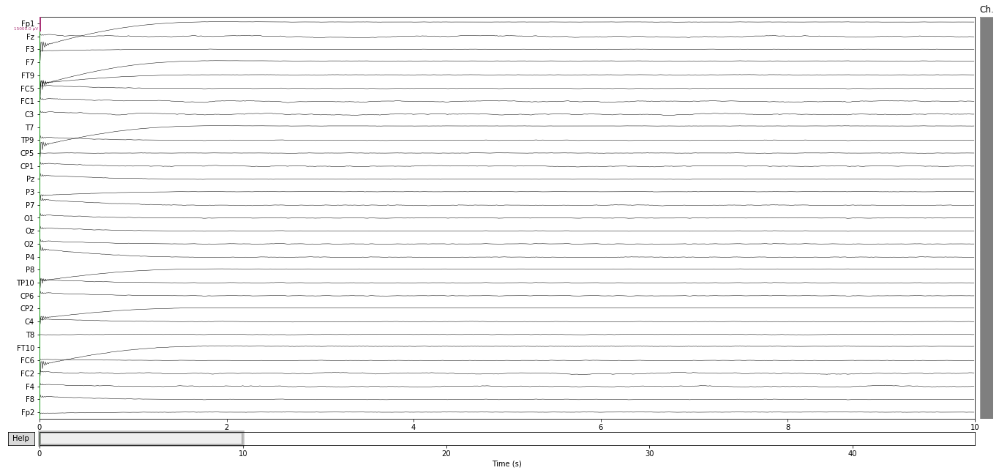

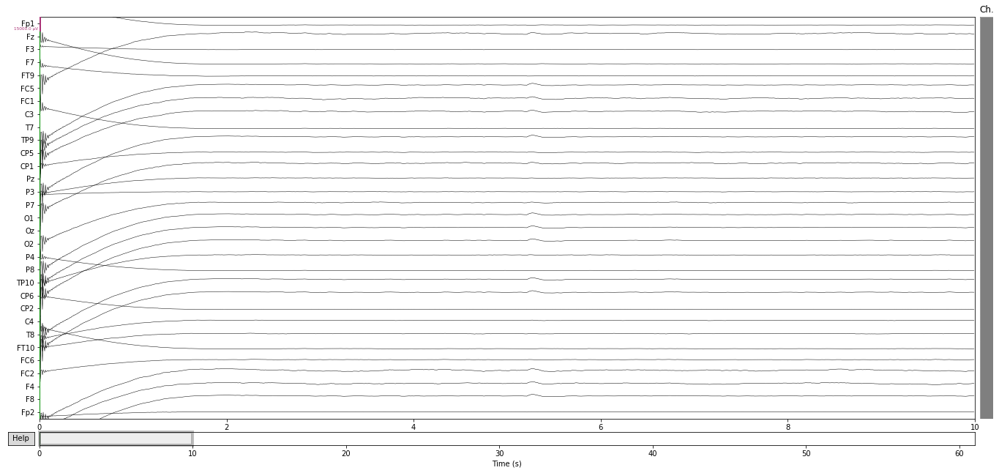

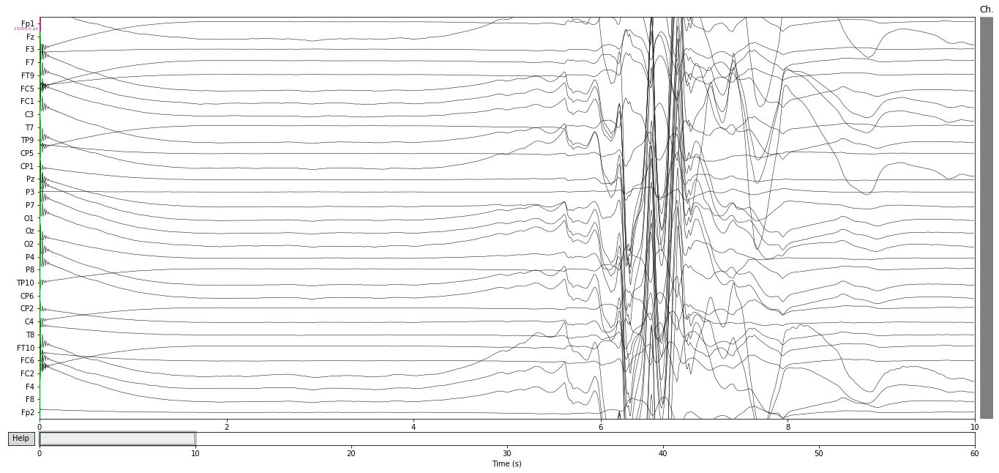

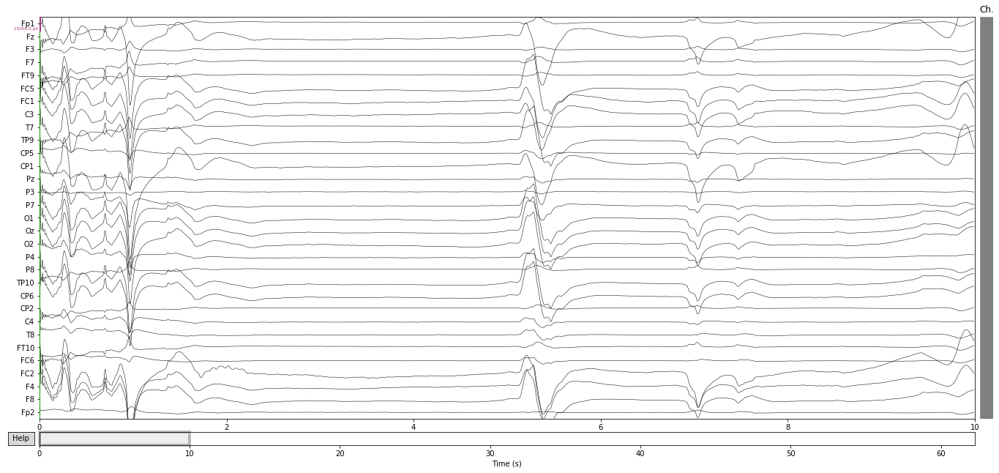

In [23]:
# EEG TIME PLOT ('all channels')
for e in range(len(epochs)):
    epochs_filtered[e].plot(scalings={"eeg": 75e-4},title='Filtered %s EEG signal'%(epochs_titles[e]), verbose=verbose,n_channels=n_channels)
    plt.show()

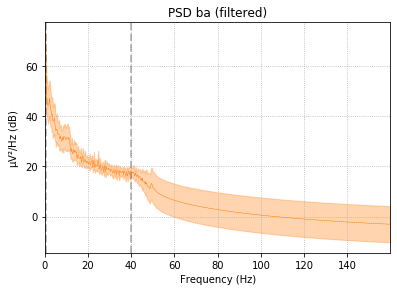

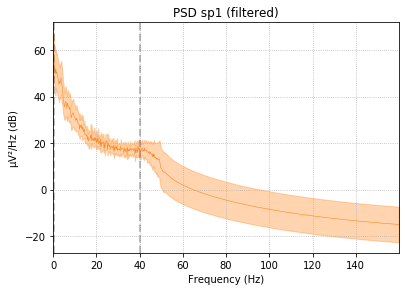

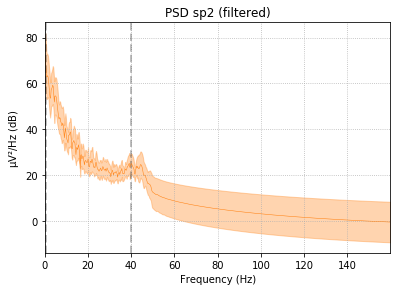

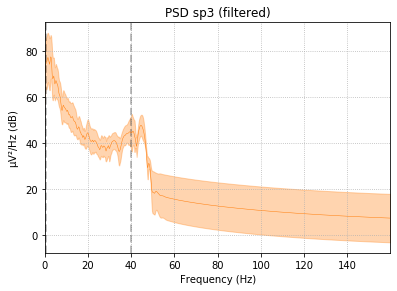

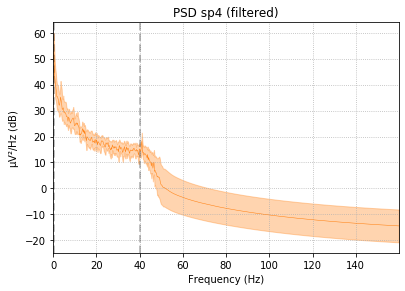

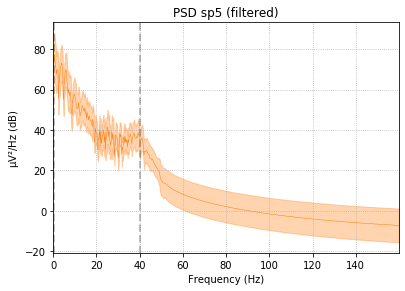

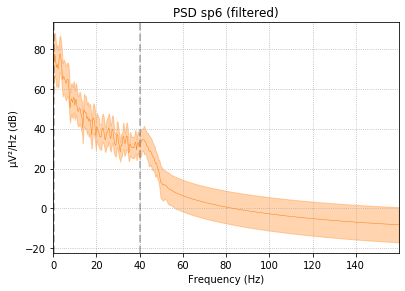

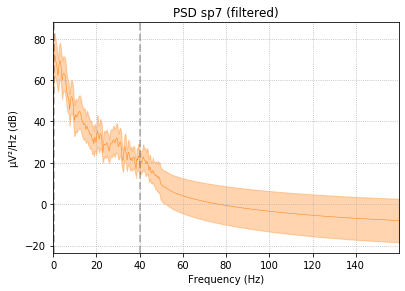

In [24]:
# PSD PLOT
for e in range(len(epochs)):
    epochs_filtered[e].plot_psd(fmax=160,proj=True, color='tab:orange', show=False, average=True,estimate='power')
    plt.title('PSD %s (filtered)'%(epochs_titles[e]))
    plt.show()

#### EEG after applying ICA preprocessing:

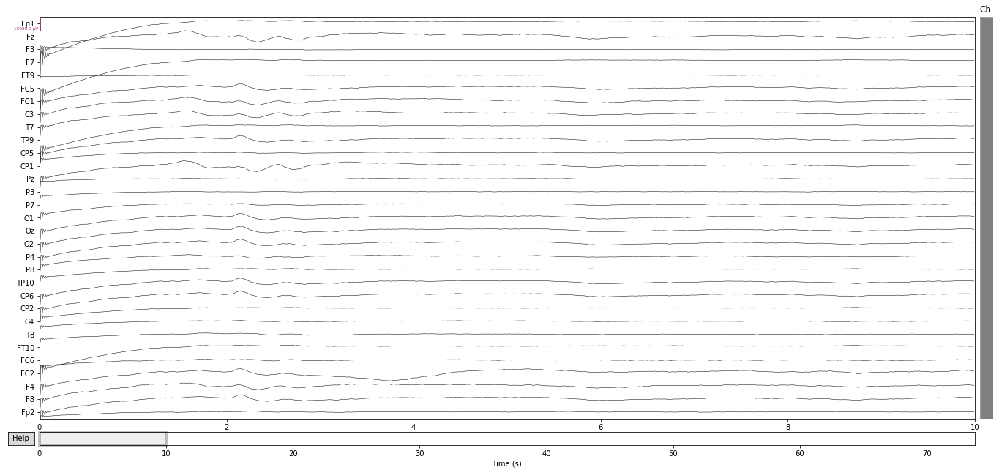

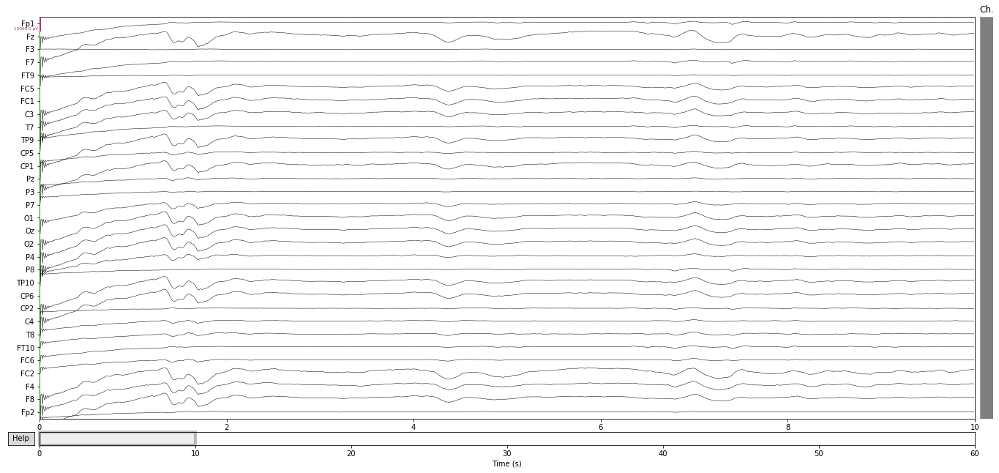

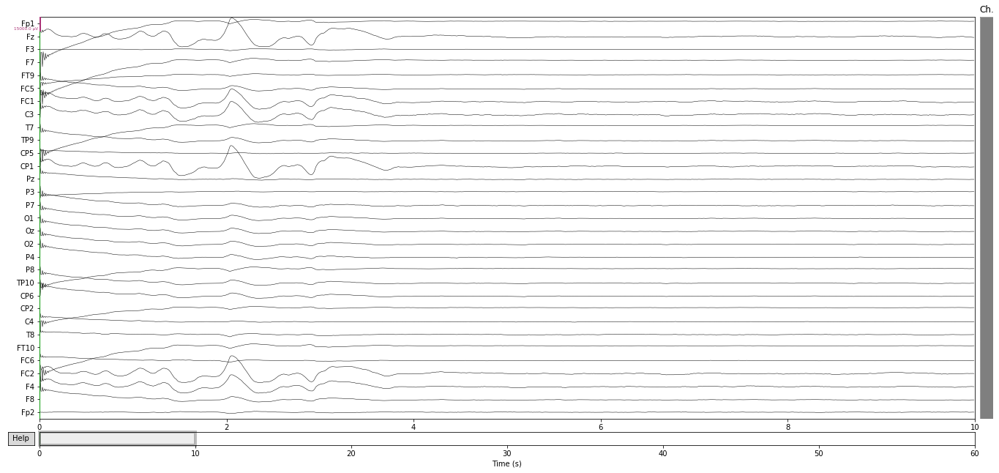

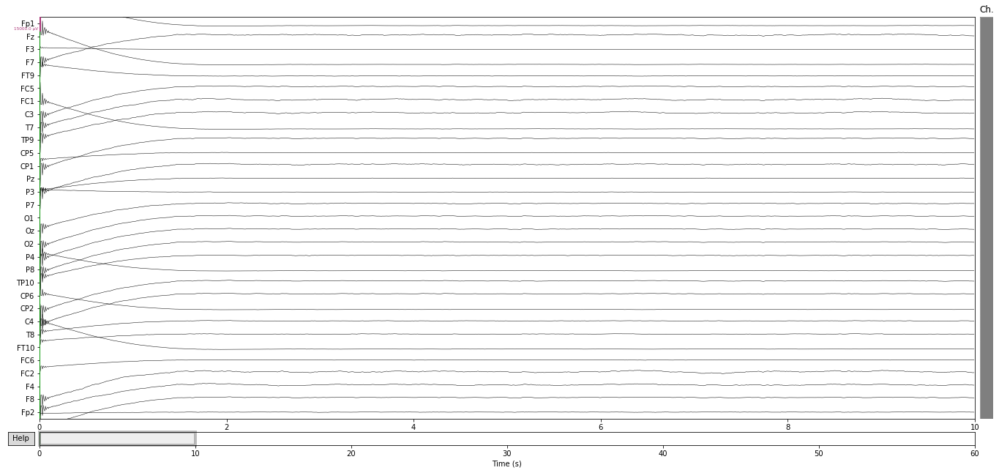

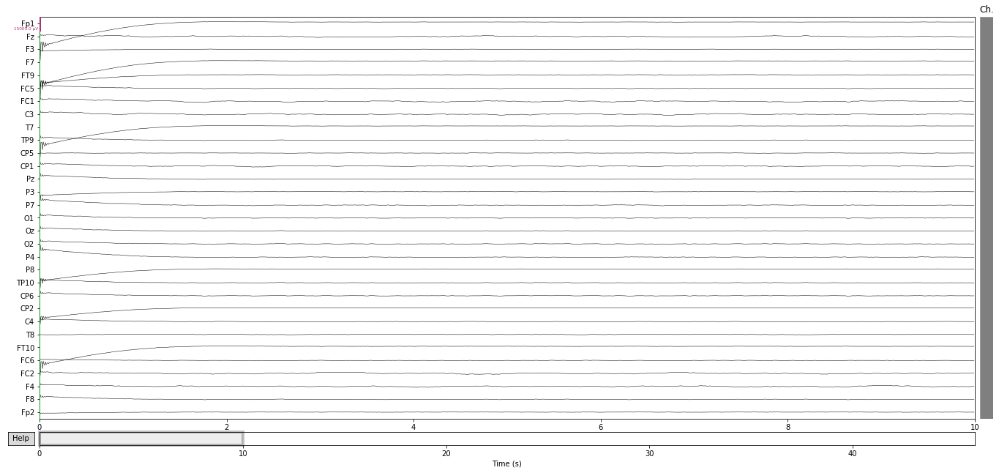

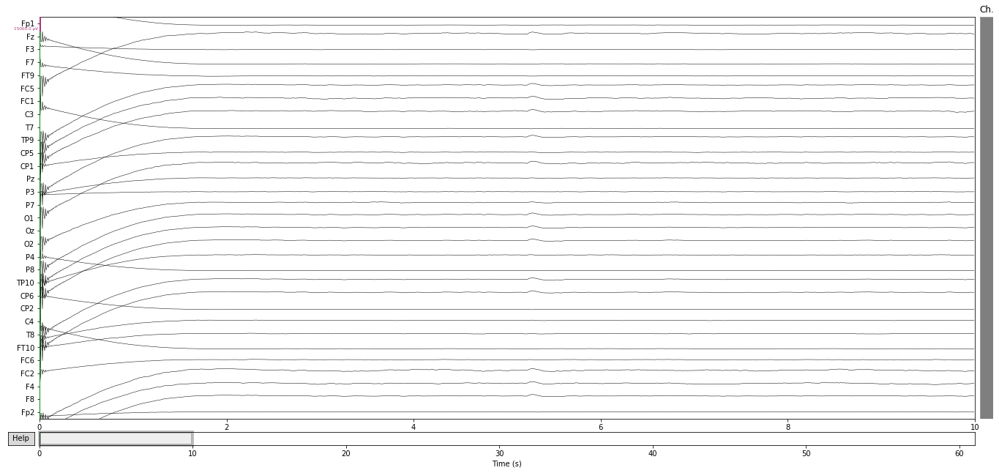

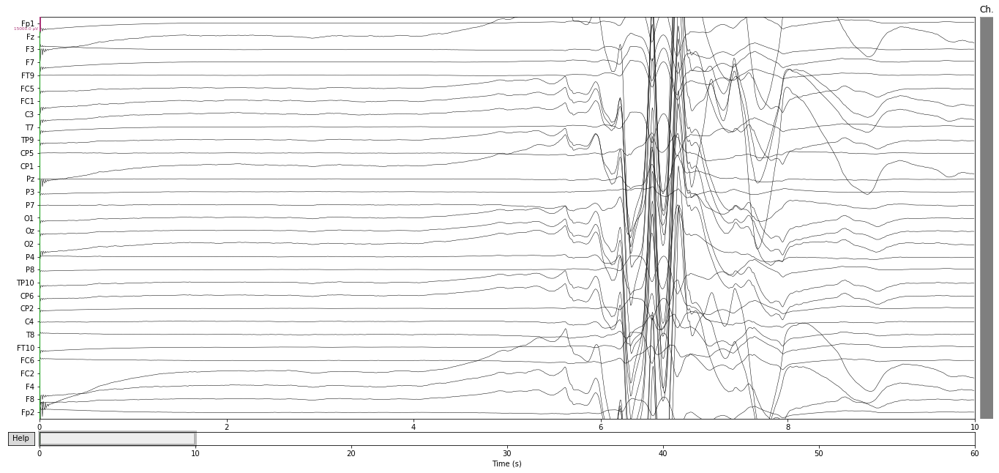

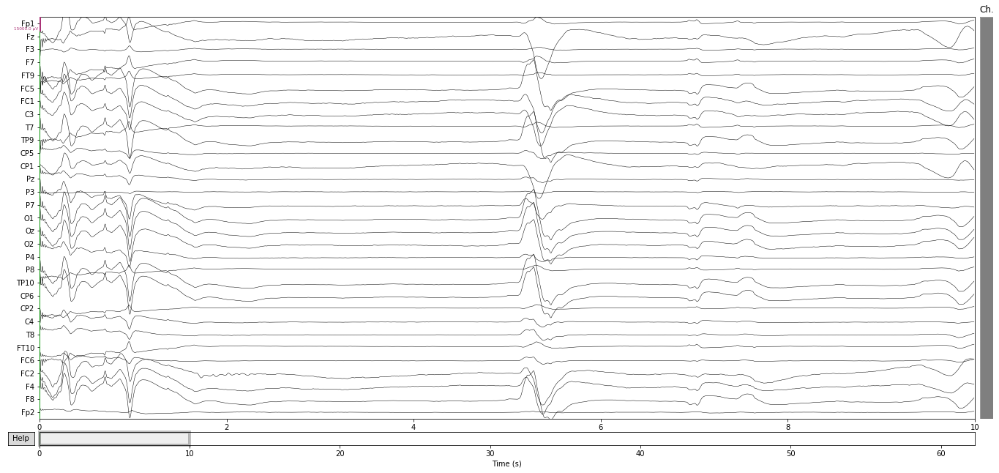

In [25]:
# EEG TIME PLOT ('all channels')
for e in range(len(epochs)):
    epochs_corrected[e].plot(scalings={"eeg": 75e-4},title='ICA corrected %s EEG signal'%(epochs_titles[e]), verbose=verbose,n_channels=n_channels)
    plt.show()

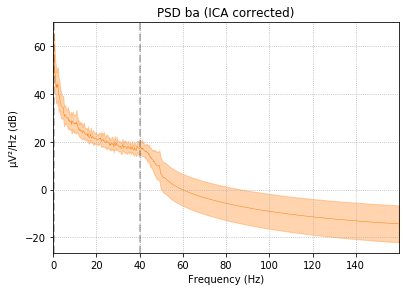

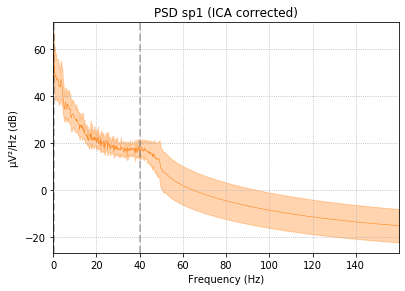

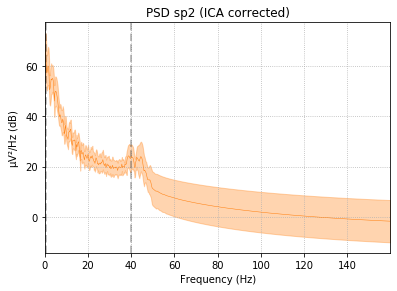

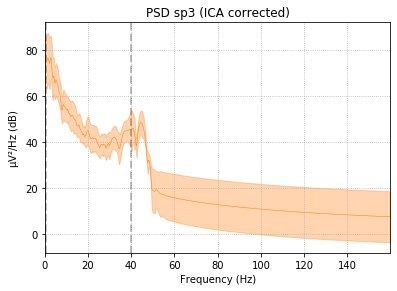

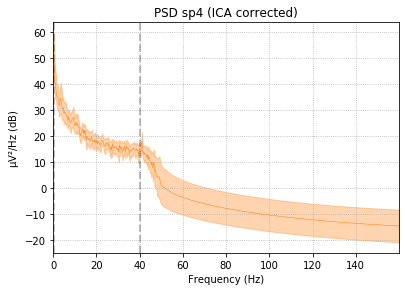

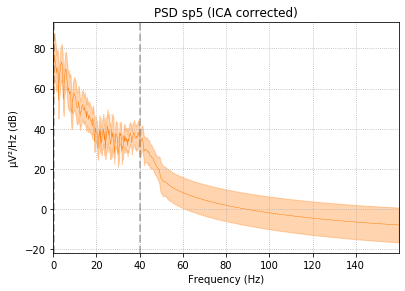

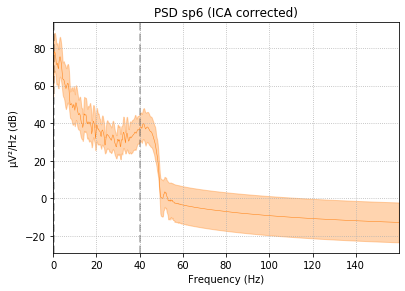

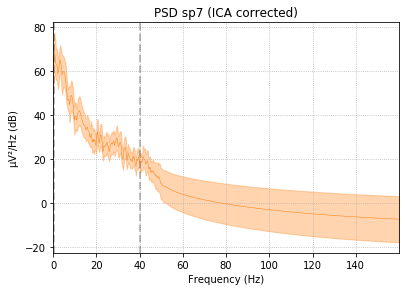

In [26]:
# PSD PLOT
for e in range(len(epochs)):
    epochs_corrected[e].plot_psd(fmax=160,proj=True, color='tab:orange', show=False, average=True,estimate='power')
    plt.title('PSD %s (ICA corrected)'%(epochs_titles[e]))
    plt.show()

In [27]:
plt.close('all')

# PULL TOGETHER THE SPOTS??